#INSTALANDO OS PACOTES NECESSÁRIOS, MONTANDO O DRIVE E IMPORTANDO OS MÓDULOS

In [1]:
!pip install python-youtube
!pip install pytube
!pip install scikit-video #http://www.scikit-video.org/stable/io.html

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.9/85.9 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 34.9 MB/s eta 0:00:00a 0:00:01


In [142]:
from pytube import YouTube
import numpy as np
import skvideo.io
import cv2
import os
import matplotlib.pyplot as plt
import time
from matplotlib.image import imread, imsave
from random import choices, shuffle, randint
from gc import collect
import tensorflow as tf

#FAZENDO DOWNLOAD DOS VIDEOS E GERANDO AS SEQUÊNCIAS DE FRAMES

In [3]:
"""def download_video(link):
    yt_obj = YouTube(link)
    filters = yt_obj.streams.filter(progressive=True, file_extension='mp4')
    filters.get_highest_resolution().download()
    #filters.get_loast_resolution().download()

links = ['https://www.youtube.com/watch?v=G_oE07-EdpM&list=PLrUSEm45vPcOKSBk8bopZyY0W3oZGU_I7&index=25&ab_channel=CSGOPOVDemos%26Highlights',
         'https://www.youtube.com/watch?v=gClc5Yr1JRk&list=PLrUSEm45vPcOKSBk8bopZyY0W3oZGU_I7&index=36&ab_channel=CSGOPOVDemos%26Highlights',
         'https://www.youtube.com/watch?v=SpqE8cUt1mc&list=PLrUSEm45vPcOKSBk8bopZyY0W3oZGU_I7&index=115&ab_channel=CSGOPOVDemos%26Highlights',
         'https://www.youtube.com/watch?v=-UqJFImH00Q&list=PLrUSEm45vPcOKSBk8bopZyY0W3oZGU_I7&index=130&ab_channel=CSGOPOVDemos%26Highlights',
         'https://www.youtube.com/watch?v=pG4n9Hns5SE&list=PLrUSEm45vPcOKSBk8bopZyY0W3oZGU_I7&index=152&ab_channel=CSGOPOVDemos%26Highlights',
         'https://www.youtube.com/watch?v=RaP-AH_R2Co&list=PLrUSEm45vPcOKSBk8bopZyY0W3oZGU_I7&index=95&ab_channel=CSGOPOVDemos%26Highlights',
         'https://www.youtube.com/watch?v=qFWRHrn4iNc&list=PLrUSEm45vPcOKSBk8bopZyY0W3oZGU_I7&index=159&ab_channel=CSGOPOVDemos%26Highlights',
         'https://www.youtube.com/watch?v=-zULa8eGt8A&list=PLrUSEm45vPcOKSBk8bopZyY0W3oZGU_I7&index=217&ab_channel=CSGOPOVDemos%26Highlights']

for link in links:
  download_video(link)"""

"def download_video(link):\n    yt_obj = YouTube(link)\n    filters = yt_obj.streams.filter(progressive=True, file_extension='mp4')\n    filters.get_highest_resolution().download()\n    #filters.get_loast_resolution().download()\n\nlinks = ['https://www.youtube.com/watch?v=G_oE07-EdpM&list=PLrUSEm45vPcOKSBk8bopZyY0W3oZGU_I7&index=25&ab_channel=CSGOPOVDemos%26Highlights',\n         'https://www.youtube.com/watch?v=gClc5Yr1JRk&list=PLrUSEm45vPcOKSBk8bopZyY0W3oZGU_I7&index=36&ab_channel=CSGOPOVDemos%26Highlights',\n         'https://www.youtube.com/watch?v=SpqE8cUt1mc&list=PLrUSEm45vPcOKSBk8bopZyY0W3oZGU_I7&index=115&ab_channel=CSGOPOVDemos%26Highlights',\n         'https://www.youtube.com/watch?v=-UqJFImH00Q&list=PLrUSEm45vPcOKSBk8bopZyY0W3oZGU_I7&index=130&ab_channel=CSGOPOVDemos%26Highlights',\n         'https://www.youtube.com/watch?v=pG4n9Hns5SE&list=PLrUSEm45vPcOKSBk8bopZyY0W3oZGU_I7&index=152&ab_channel=CSGOPOVDemos%26Highlights',\n         'https://www.youtube.com/watch?v=RaP-AH_R

In [4]:
HEIGHT = 180
WIDTH = 320

In [5]:
"""frame_set_number = 0
for demo_name in os.listdir():
  if demo_name[-3:] == 'mp4':
    frames_from_demo = skvideo.io.vreader(demo_name)
    frames = []
    passed_frames = 0
    for frame in frames_from_demo:
        passed_frames += 1
        if passed_frames == 35 or passed_frames == 37:
            frames.append(cv2.resize(frame, (WIDTH, HEIGHT))/255.0)
        elif passed_frames == 39:
            frame_set_number += 1
            image = np.concatenate((frames[0], frames[1], cv2.resize(frame, (WIDTH, HEIGHT))/255.0), axis=1)
            imsave(f'/content/drive/MyDrive/frames_from_csgodemos/de_inferno_ropz/frame{frame_set_number}.png', image)
            frames = []
            passed_frames = 0
            collect()"""

"frame_set_number = 0\nfor demo_name in os.listdir():\n  if demo_name[-3:] == 'mp4':\n    frames_from_demo = skvideo.io.vreader(demo_name)\n    frames = []\n    passed_frames = 0\n    for frame in frames_from_demo:\n        passed_frames += 1\n        if passed_frames == 35 or passed_frames == 37:\n            frames.append(cv2.resize(frame, (WIDTH, HEIGHT))/255.0)\n        elif passed_frames == 39:\n            frame_set_number += 1\n            image = np.concatenate((frames[0], frames[1], cv2.resize(frame, (WIDTH, HEIGHT))/255.0), axis=1)\n            imsave(f'/content/drive/MyDrive/frames_from_csgodemos/de_inferno_ropz/frame{frame_set_number}.png', image)\n            frames = []\n            passed_frames = 0\n            collect()"

#LENDO OS DADOS

In [6]:
HEIGHT = 180
WIDTH = 320
path1 = '/kaggle/input/csgo-frames/frames_from_csgodemos-20230609T154604Z-001/frames_from_csgodemos/de_inferno_ropz/'
path2 = '/kaggle/input/csgo-frames/frames_from_csgodemos-20230609T154604Z-002/frames_from_csgodemos/de_inferno_ropz/'

data_paths = list(map(lambda x: path1+x, os.listdir(path1))) + list(map(lambda x: path2+x, os.listdir(path2)))
shuffle(data_paths)
train_paths = data_paths[0:10000]
val_paths = data_paths[10000:11500]
test_paths = data_paths[11500:]

In [7]:
print(len(train_paths), len(val_paths), len(test_paths))

10000 1500 2062


In [8]:
def get_data(pathfile):
    full_image = imread(pathfile)
    first_frame = full_image[:,:WIDTH,:]
    second_frame = full_image[:,WIDTH*2:,:]
    intermediate_frame = full_image[:,WIDTH:WIDTH*2:,:]
    return first_frame, second_frame, intermediate_frame

In [9]:
def create_batch_for_frames_generator(batch_size, start_point, path):
    batch_features = []
    batch_labels = []
    for i in range(start_point, start_point+batch_size):
        frame_sequence = get_data(path[i])
        batch_features.append([frame_sequence[0], frame_sequence[2]])
        batch_labels.append(frame_sequence[1])

    return np.array(batch_features), np.array(batch_labels)

In [10]:
def create_batch_for_auto_encoder(batch_size, start_point, path):
    batch_features = []
    for i in range(start_point, start_point+batch_size):
        frame_sequence = get_data(path[i])
        for idx, frame in enumerate(frame_sequence):
            batch_features.append(frame_sequence[idx])

    return np.array(batch_features)

#CRIANDO UM AUTOENCODER CONVOLUCIONAL

In [11]:
encoder = tf.keras.Sequential()
encoder.add(tf.keras.layers.Conv2D(16, (8, 5), padding='same', strides=1, activation='relu'))
encoder.add(tf.keras.layers.Conv2D(32, (4, 2), padding='same', strides=1, activation='relu'))
encoder.add(tf.keras.layers.Conv2D(64, (4, 2), padding='same', strides=2, activation='relu'))
encoder.add(tf.keras.layers.Conv2D(128, (4, 2), padding='same', strides=2, activation='relu'))

decoder = tf.keras.Sequential()
decoder.add(tf.keras.layers.Conv2DTranspose(128, (4, 2), padding='same', strides=1, activation='relu'))
decoder.add(tf.keras.layers.Conv2DTranspose(256, (4, 2), padding='same', strides=2, activation='relu'))
decoder.add(tf.keras.layers.Conv2DTranspose(512, (4, 2), padding='same', strides=2, activation='relu'))
decoder.add(tf.keras.layers.Conv2DTranspose(4, (4, 2), padding='same', strides=1, activation='sigmoid'))

auto_encoder = tf.keras.Sequential([encoder, decoder])
auto_encoder.compile(optimizer='adam', loss='mse')

In [12]:
#routine for auto encoder training
batch_size = 8
n_epochs = 10
loss = []
for epoch in range(n_epochs):
    print(f'{epoch+1}/{n_epochs}', end=' - ')
    start_point = 0
    shuffle(train_paths)
    while start_point < 3500:
        batch_for_train = create_batch_for_auto_encoder(batch_size, start_point, train_paths)
        loss.append(auto_encoder.train_on_batch(batch_for_train, batch_for_train))
        start_point += batch_size
    print(sum(loss)/len(loss))
    loss = []

1/10 - 0.009297153363897376
2/10 - 0.001861612843673838
3/10 - 0.0009527600034922531
4/10 - 0.0006541166969917323
5/10 - 0.0005231723657806008
6/10 - 0.00043927379382814634
7/10 - 0.00037700721577286177
8/10 - 0.00033095121499550736
9/10 - 0.00029066336015212777
10/10 - 0.00025332147081049805


In [48]:
encoder.save_weights('/kaggle/working/encoder_weights/weights')

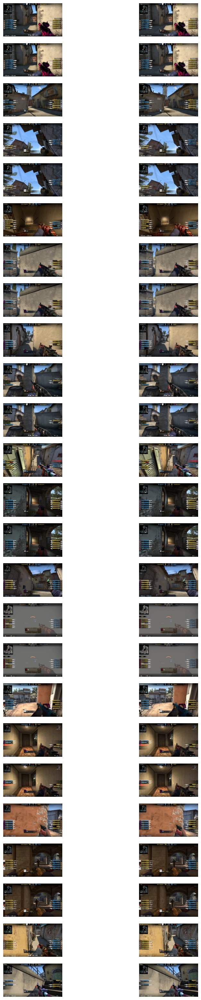

In [140]:
#results from autoencoder
plt.figure(figsize=(10, 40))
batch_for_train = create_batch_for_auto_encoder(25, 0, val_paths)
for i in range(0, 50, 2):
    plt.subplot(25, 2, i+1)
    plt.imshow(batch_for_train[i])
    plt.axis('off')
    plt.subplot(25, 2, i+2)
    plt.imshow(auto_encoder(np.expand_dims(batch_for_train[i], axis=0))[0])
    plt.axis('off')

#CRIANDO AS CAMADAS E O MODELO PARA GERAÇÃO DE FRAMES


In [41]:
class ResNET_base(tf.keras.layers.Layer):
    def __init__(self, filters):
        super().__init__()
        self.conv1 = tf.keras.layers.Conv2D(filters, kernel_size=1, padding='same')
        self.conv2 = tf.keras.layers.Conv2D(filters, kernel_size=(4,2), padding='same')
        self.conv3 = tf.keras.layers.Conv2D(filters, kernel_size=1, padding='same')
        self.conv4 = tf.keras.layers.Conv2D(filters, kernel_size=(4,2), padding= 'same')

        self.bn1 = tf.keras.layers.BatchNormalization()
        self.bn2 = tf.keras.layers.BatchNormalization()
        self.leaky = tf.keras.layers.LeakyReLU(0.25)

    def call(self, data):
        processed_data = data
        processed_data = self.conv1(data)
        processed_data = self.conv2(processed_data)
        processed_data = self.bn1(processed_data)
        processed_data = self.leaky(processed_data)
        processed_data = self.conv3(processed_data)
        processed_data = self.conv4(processed_data)
        processed_data = self.bn2(processed_data)
        processed_data = self.leaky(processed_data)

        return tf.concat((processed_data, data), axis=-1)

In [78]:
class frames_processor(tf.keras.Model):
    def __init__(self):
        super().__init__()        
        self.conv_a1 = tf.keras.layers.Conv2D(filters=8, kernel_size=5, padding='same', activation='relu', input_shape=[320, 180, 4]) 
        self.conv_a2 = tf.keras.layers.Conv2D(filters=16, kernel_size=1,padding='same') 
        self.conv_a3 = tf.keras.layers.Conv2D(filters=16, kernel_size=(2,4), strides = 1, padding='same', activation='relu')
        self.resnet_a1 = ResNET_base(filters=16)
        self.resnet_a2 = ResNET_base(filters=32)
        self.resnet_a3 = ResNET_base(filters=64)
        self.resnet_a4 = ResNET_base(filters=128)
        
        self.conv_b1 = tf.keras.layers.Conv2D(filters=8, kernel_size=5, padding='same', activation='relu', input_shape=[320, 180, 4]) 
        self.conv_b2 = tf.keras.layers.Conv2D(filters=16, kernel_size=1, padding='same') 
        self.conv_b3 = tf.keras.layers.Conv2D(filters=16, kernel_size=(2,4), padding='same', activation='relu')
        self.resnet_b1 = ResNET_base(filters=16)
        self.resnet_b2 = ResNET_base(filters=32)
        self.resnet_b3 = ResNET_base(filters=64)
        self.resnet_b4 = ResNET_base(filters=128)

        self.resnet_final = ResNET_base(filters=256)

        self.final_conv1 = tf.keras.layers.Conv2D(filters=512, kernel_size=1, activation='relu', padding='same')
        self.final_conv2 = tf.keras.layers.Conv2D(filters=512, kernel_size=(2,4), activation='relu', padding='same')
        self.final_conv3 = tf.keras.layers.Conv2D(filters=512, kernel_size=1, activation='relu', padding='same')
        self.final_conv4 = tf.keras.layers.Conv2D(filters=512, kernel_size=(2,4), activation='relu', padding='same')
        self.final_conv5 = tf.keras.layers.Conv2D(filters=4, kernel_size=(2,4), activation='sigmoid', padding='same')
        
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.bn2 = tf.keras.layers.BatchNormalization()
        self.bn3 = tf.keras.layers.BatchNormalization()
        self.bn4 = tf.keras.layers.BatchNormalization()
        self.bn5 = tf.keras.layers.BatchNormalization()
        self.bn6 = tf.keras.layers.BatchNormalization()

    def call(self, frames):
        first_frame = tf.squeeze(frames[:,0,:,:])
        last_frame = tf.squeeze(frames[:,1,:,:])

        #computing all values for first_frame
        first_frame = self.conv_a1(first_frame)
        first_frame = self.bn1(first_frame)
        first_frame = self.conv_a2(first_frame)
        first_frame = self.conv_a3(first_frame)
        first_frame = self.bn2(first_frame)
        first_frame = self.resnet_a1(first_frame)
        first_frame = self.resnet_a2(first_frame) 
        first_frame = self.resnet_a3(first_frame)
        first_frame = self.resnet_a4(first_frame)

        #computing all values for last_frame
        last_frame = self.conv_b1(last_frame)
        last_frame = self.bn3(last_frame)
        last_frame = self.conv_b2(last_frame)
        last_frame = self.conv_b3(last_frame)
        last_frame = self.bn4(last_frame)
        last_frame = self.resnet_b1(last_frame)
        last_frame = self.resnet_b2(last_frame) 
        last_frame = self.resnet_b3(last_frame)
        last_frame = self.resnet_b4(last_frame)

        #computing values with concatenate version of pos processed frames
        frames_contatenate = tf.concat((first_frame, last_frame), axis=-1)
        frames_concatenate = self.resnet_final(frames_contatenate)
        frames_concatenate = self.final_conv1(frames_concatenate)
        frames_concatenate = self.final_conv2(frames_concatenate)
        frames_concatenate = self.bn5(frames_concatenate)
        frames_concatenate = self.final_conv3(frames_concatenate)
        frames_concatenate = self.final_conv4(frames_concatenate)
        frames_concatenate = self.bn6(frames_concatenate)
        frames_concatenate = self.final_conv5(frames_concatenate)
        
        return frames_concatenate

In [97]:
def encoded_mse(y_true, y_pred):
    y_true = encoder(y_true)
    y_pred = encoder(y_pred)
    squared_difference = tf.square(y_true - y_pred)
    return tf.reduce_mean(squared_difference, axis=-1)

#TREINANDO O MODELO

In [99]:
frame_processing = frames_processor()
frame_processing.build([4, 2, 320, 180, 4])
frame_processing.compile(optimizer='adam', loss=encoded_mse)

In [100]:
frame_processing.summary()

Model: "frames_processor_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1096 (Conv2D)        multiple                  808       
                                                                 
 conv2d_1097 (Conv2D)        multiple                  144       
                                                                 
 conv2d_1098 (Conv2D)        multiple                  2064      
                                                                 
 res_net_base_189 (ResNET_ba  multiple                 4800      
 se)                                                             
                                                                 
 res_net_base_190 (ResNET_ba  multiple                 18816     
 se)                                                             
                                                                 
 res_net_base_191 (ResNET_ba  multiple         

In [102]:
batch_size = 4
epochs = 10
loss = []
for epoch in range(epochs):
    init = time.time()
    print(f"{epoch+1}/{epochs}:")
    start_point = 0
    shuffle(train_paths)
    while start_point + batch_size < 1500:
        batch_for_train = create_batch_for_frames_generator(batch_size, start_point, train_paths)
        loss.append(frame_processing.train_on_batch(batch_for_train[0], batch_for_train[1]))
        start_point += batch_size
    print(f"      processing time: {int(time.time() - init)} seconds")
    print(f"      epoch MSE: {sum(loss)/len(loss)}")
    print("===============================================")
    frame_processing.save_weights(f'/kaggle/working/frame_processing_{epoch}/weights')
    

1/10:
    processing time: 598.7999086380005
    epoch loss: 0.00645494739180132
2/10:
    processing time: 591.311939239502
    epoch loss: 0.006300754479710312
3/10:
    processing time: 594.334543466568
    epoch loss: 0.006361523797215127
4/10:
    processing time: 597.1495203971863
    epoch loss: 0.006340600508153139
5/10:
    processing time: 594.1910195350647
    epoch loss: 0.006215200526639819
6/10:
    processing time: 596.2997443675995
    epoch loss: 0.006114263373154005
7/10:
    processing time: 596.6229193210602
    epoch loss: 0.006072077468171719
8/10:
    processing time: 603.023145198822
    epoch loss: 0.006024668299867572
9/10:
    processing time: 595.8974425792694
    epoch loss: 0.005962495536680942
10/10:
    processing time: 598.0737690925598
    epoch loss: 0.005896007398113529


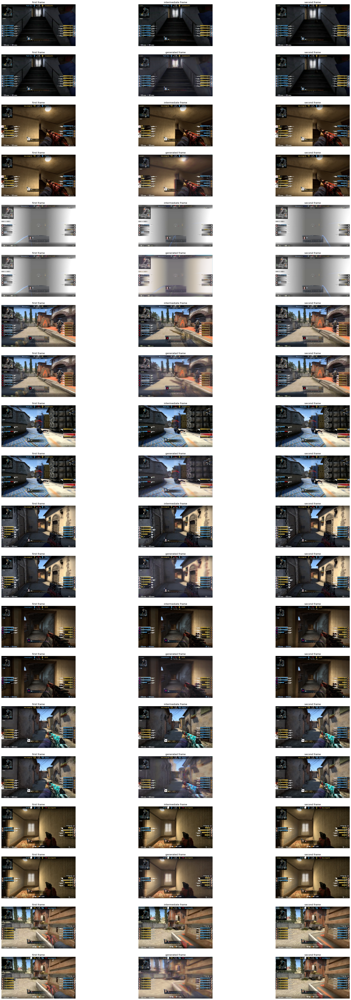

In [144]:
plt.figure(figsize=(35, 90))
for i in range(0, 60, 6):
    idx = randint(10,1000)
    f1, f2, fr = get_data(test_paths[idx])
    frames, _ = create_batch_for_frames_generator(2, idx, test_paths)
    im = frame_processing.predict(frames, verbose=0)[0]
    plt.subplot(20, 3, i+1)
    plt.title('first frame')
    plt.axis('off')
    plt.imshow(f1)
    plt.subplot(20, 3, i+2)
    plt.title('intermediate frame')
    plt.axis('off')
    plt.imshow(fr)
    plt.subplot(20, 3, i+3)
    plt.title('second frame')
    plt.axis('off')
    plt.imshow(f2)

    plt.subplot(20, 3, i+4)
    plt.title('first frame')
    plt.axis('off')
    plt.imshow(f1)
    plt.subplot(20, 3, i+5)
    plt.title('generated frame')
    plt.axis('off')
    plt.imshow(im)
    plt.subplot(20, 3, i+6)
    plt.title('second frame')
    plt.axis('off')
    plt.imshow(f2)
    